In [62]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt

In [63]:
df = pd.read_csv('Fraud_Data.csv', parse_dates = ['signup_time', 'purchase_time'])
ip = pd.read_csv('IpAddress_to_Country.csv')

In [64]:
ip['lower_bound_ip_address'] = ip.lower_bound_ip_address.astype(int)
ip['upper_bound_ip_address'] = ip.upper_bound_ip_address.astype(int)

In [65]:
df['ip_address'] = df.ip_address.astype(int)

In [66]:
df['class'].value_counts()/len(df['class'])

0    0.906354
1    0.093646
Name: class, dtype: float64

In [67]:
df.head()

,user_id,signup_time,purchase_time,purchase_value,device_id,source,browser,sex,age,ip_address,class
0,22058,2015-02-24 22:55:49,2015-04-18 02:47:11,34,QVPSPJUOCKZAR,SEO,Chrome,M,39,732758368,0
1,333320,2015-06-07 20:39:50,2015-06-08 01:38:54,16,EOGFQPIZPYXFZ,Ads,Chrome,F,53,350311387,0
2,1359,2015-01-01 18:52:44,2015-01-01 18:52:45,15,YSSKYOSJHPPLJ,SEO,Opera,M,53,-2147483648,1
3,150084,2015-04-28 21:13:25,2015-05-04 13:54:50,44,ATGTXKYKUDUQN,SEO,Safari,M,41,-2147483648,0
4,221365,2015-07-21 07:09:52,2015-09-09 18:40:53,39,NAUITBZFJKHWW,Ads,Safari,M,45,415583117,0


In [68]:
df['delta'] = (df.purchase_time - df.signup_time)
df['delta'] = df.delta/np.timedelta64(1, 's')

In [69]:
df['Heure'] = df['purchase_time'].dt.hour

In [70]:
df['Jour'] = df['purchase_time'].dt.weekday

In [71]:
df['Mois'] = df['purchase_time'].dt.month

ip_data=df.iloc[:,9]

k=[]
for i in range(len(ip_data)):
    ip1=ip_data[i]
    tmp=ip[(ip['lower_bound_ip_address']<=ip1) & (ip['upper_bound_ip_address']>=ip1)]['country'].tolist()
k.extend(tmp if tmp else 'NULL')


In [72]:
def ipp(x):
    try :
        return ip[(ip['lower_bound_ip_address']<=x) & (ip['upper_bound_ip_address']>= x)]['country'].array[0]
    except:
        return np.nan
    

In [73]:
%time df['pays'] = df['ip_address'].apply(ipp)

Wall time: 6min 54s


In [74]:
fraud_pc = pd.DataFrame((df[df['class']==1].groupby(['pays'])['class'].count()/df.groupby(['pays'])['class'].count())*100)

In [75]:
fraud_pc = fraud_pc[~fraud_pc['class'].isna()]
fraud_pc = pd.concat([fraud_pc,pd.DataFrame(df.groupby(['pays'])['class'].count())],axis = 1)
fraud_pc.columns = ['fraud','obs']

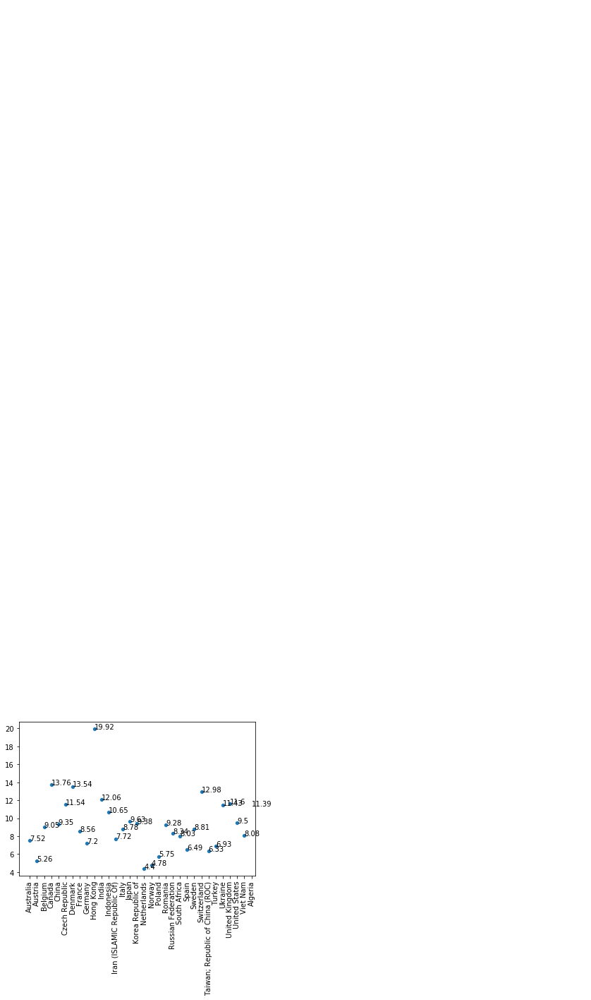

In [76]:
#fig,ax = plt.subplots(figsize = (10,10))
sns.scatterplot(data = fraud_pc['fraud'][fraud_pc.obs > 200])
plt.xticks(rotation = 90)
#plt.ylim([0,50000])
for i in fraud_pc.index:
    plt.annotate(round(fraud_pc['fraud'].loc[i],2),xy = (i,fraud_pc['fraud'].loc[i]))

In [77]:
df = df[df.pays.isin(list(fraud_pc[fraud_pc.obs > 200].sort_values(by = 'fraud', ascending = False).index))]

In [78]:
dummies = pd.get_dummies(df[['source','browser','sex','pays']])

In [79]:
dff = pd.concat([df,dummies],axis = 1)

In [80]:
dff = dff.drop(columns = ['source','browser','sex','pays'])

In [81]:
dff.columns

Index(['user_id', 'signup_time', 'purchase_time', 'purchase_value',
       'device_id', 'age', 'ip_address', 'class', 'delta', 'Heure', 'Jour',
       'Mois', 'source_Ads', 'source_Direct', 'source_SEO', 'browser_Chrome',
       'browser_FireFox', 'browser_IE', 'browser_Opera', 'browser_Safari',
       'sex_F', 'sex_M', 'pays_Australia', 'pays_Austria', 'pays_Belgium',
       'pays_Canada', 'pays_China', 'pays_Czech Republic', 'pays_Denmark',
       'pays_France', 'pays_Germany', 'pays_Hong Kong', 'pays_India',
       'pays_Indonesia', 'pays_Iran (ISLAMIC Republic Of)', 'pays_Italy',
       'pays_Japan', 'pays_Korea Republic of', 'pays_Netherlands',
       'pays_Norway', 'pays_Poland', 'pays_Romania', 'pays_Russian Federation',
       'pays_South Africa', 'pays_Spain', 'pays_Sweden', 'pays_Switzerland',
       'pays_Taiwan; Republic of China (ROC)', 'pays_Turkey', 'pays_Ukraine',
       'pays_United Kingdom', 'pays_United States', 'pays_Viet Nam'],
      dtype='object')

In [82]:
X = dff.drop(columns = ['device_id', 'signup_time','user_id','ip_address','class','purchase_time','Jour','Mois'])
Y = dff[['class']]

In [83]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.3, stratify = Y, random_state = 42)

In [84]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()

X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# Regression Logistique

In [85]:
from sklearn.linear_model import LogisticRegression

log = LogisticRegression()

log.fit(X_train,Y_train)

C:\Users\tashi\anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


LogisticRegression()

In [86]:
print(log.score(X_train,Y_train))
print(log.score(X_test,Y_test))

0.9065322969924442
0.9065416264423298


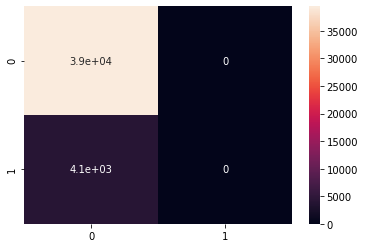

In [87]:
from sklearn import metrics 
y_pred1 = log.predict(X_test)
cm = metrics.confusion_matrix(Y_test, y_pred1)
sns.heatmap(cm, annot=True)

In [88]:
dfpred = pd.DataFrame({'pred':y_pred1,'actual':Y_test['class'].values})
FN = dfpred.pred[(dfpred.actual == 1) & (dfpred.pred == 0)].count()
TP = dfpred.actual[(dfpred.actual == 1) & (dfpred.pred == 1)].count()
FP = dfpred.actual[(dfpred.actual == 0) & (dfpred.pred == 1)].count()
TN = dfpred.actual[(dfpred.actual == 0) & (dfpred.pred == 0)].count()

In [89]:
Accuracy = (TP+TN)/(TP+TN+FP+FN)*100
Recall = TP/(TP+FN)*100
Precision = TP/(TP + FP)*100
print("Le taux d'Accuracy du modèle est de {}% (le pourcentage de nos predictions qui se sont avéré correctes)".format(round(Accuracy,2)))
print("Le taux de Recall du modèle est de {}% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)".format(round(Recall,2)))
print("Le taux de Precision du modèle est de {}% (le pourcentage de prediction 1 qui sont correctes)".format(round(Precision,2)))

Le taux d'Accuracy du modèle est de 90.65% (le pourcentage de nos predictions qui se sont avéré correctes)
Le taux de Recall du modèle est de 0.0% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)
Le taux de Precision du modèle est de nan% (le pourcentage de prediction 1 qui sont correctes)


C:\Users\tashi\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in long_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


In [90]:
Y['class'].value_counts()/Y['class'].count()*100

0    90.65351
1     9.34649
Name: class, dtype: float64

# SVM

In [91]:
from sklearn import svm

model = svm.SVC(kernel = 'rbf')

model.fit(X_train,Y_train)

C:\Users\tashi\anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


SVC()

In [92]:
model.score(X_test,Y_test)

0.9073690985151474

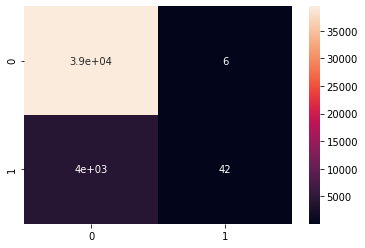

In [93]:
from sklearn import metrics 
y_pred2 = model.predict(X_test)
cm = metrics.confusion_matrix(Y_test, y_pred2)
sns.heatmap(cm, annot=True)

In [94]:
dfpred2 = pd.DataFrame({'pred':y_pred2,'actual':Y_test['class'].values})
FN2 = dfpred2.pred[(dfpred2.actual == 1) & (dfpred2.pred == 0)].count()
TP2 = dfpred2.actual[(dfpred2.actual == 1) & (dfpred2.pred == 1)].count()
FP2 = dfpred2.actual[(dfpred2.actual == 0) & (dfpred2.pred == 1)].count()
TN2 = dfpred2.actual[(dfpred2.actual == 0) & (dfpred2.pred == 0)].count()

In [95]:
Accuracy = (TP2+TN2)/(TP2+TN2+FP2+FN2)*100
Recall = TP2/(TP2+FN2)*100
Precision = TP2/(TP2 + FP2)*100
print("Le taux d'Accuracy du modèle est de {}% (le pourcentage de nos predictions qui se sont avéré correctes)".format(round(Accuracy,2)))
print("Le taux de Recall du modèle est de {}% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)".format(round(Recall,2)))
print("Le taux de Precision du modèle est de {}% (le pourcentage de prediction 1 qui sont correctes)".format(round(Precision,2)))

Le taux d'Accuracy du modèle est de 90.74% (le pourcentage de nos predictions qui se sont avéré correctes)
Le taux de Recall du modèle est de 1.03% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)
Le taux de Precision du modèle est de 87.5% (le pourcentage de prediction 1 qui sont correctes)


from sklearn.model_selection import GridSearchCV
param_grid = {'C':[1,5,10,50], 'gamma':[0.0001, 0.0005, 0.001, 0.005]}
grid = GridSearchCV(model,param_grid, n_jobs = -1, verbose = 2)
%time grid.fit(X_train,Y_train)

print(grid.best_params_)
print(grid.score(X_train,Y_train))
grid.score(X_test,Y_test)

# Decision Tree

In [96]:
from sklearn.tree import DecisionTreeClassifier

dtc = DecisionTreeClassifier(criterion = 'gini')
dtc.fit(X_train,Y_train)

DecisionTreeClassifier()

In [97]:
import graphviz
from sklearn.tree import export_graphviz
dot_data = export_graphviz(dtc,out_file=None, feature_names = X.columns)
graph = graphviz.Source(dot_data)
graph

In [98]:
dtc.score(X_test, Y_test)

0.9051165356502552

In [99]:
y_pred3 = dtc.predict(X_test)

In [100]:
dfpred3 = pd.DataFrame({'pred':y_pred3,'actual':Y_test['class'].values})
FN3 = dfpred3.pred[(dfpred3.actual == 1) & (dfpred3.pred == 0)].count()
TP3 = dfpred3.actual[(dfpred3.actual == 1) & (dfpred3.pred == 1)].count()
FP3 = dfpred3.actual[(dfpred3.actual == 0) & (dfpred3.pred == 1)].count()
TN3 = dfpred3.actual[(dfpred3.actual == 0) & (dfpred3.pred == 0)].count()

In [101]:
dfpred3['pred'].value_counts()

0    38876
1     4630
Name: pred, dtype: int64

In [102]:
Accuracy = (TP3+TN3)/(TP3+TN3+FP3+FN3)*100
Recall = TP3/(TP3+FN3)*100
Precision = TP3/(TP3 + FP3)*100
print("Le taux d'Accuracy du modèle est de {}% (le pourcentage de nos predictions qui se sont avéré correctes)".format(round(Accuracy,2)))
print("Le taux de Recall du modèle est de {}% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)".format(round(Recall,2)))
print("Le taux de Precision du modèle est de {}% (le pourcentage de prediction 1 qui sont correctes)".format(round(Precision,2)))

Le taux d'Accuracy du modèle est de 90.51% (le pourcentage de nos predictions qui se sont avéré correctes)
Le taux de Recall du modèle est de 56.17% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)
Le taux de Precision du modèle est de 49.33% (le pourcentage de prediction 1 qui sont correctes)


## Random Forest

In [103]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators = 1000)

rfc.fit(X_train,Y_train)

C:\Users\tashi\anaconda3\lib\site-packages\ipykernel_launcher.py:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  """


RandomForestClassifier(n_estimators=1000)

In [104]:
rfc.score(X_test,Y_test)

0.9562589068174505

In [105]:
y_pred4 = rfc.predict(X_test)

In [106]:
dfpred4 = pd.DataFrame({'pred':y_pred4,'actual':Y_test['class'].values})
FN4 = dfpred4.pred[(dfpred4.actual == 1) & (dfpred4.pred == 0)].count()
TP4 = dfpred4.actual[(dfpred4.actual == 1) & (dfpred4.pred == 1)].count()
FP4 = dfpred4.actual[(dfpred4.actual == 0) & (dfpred4.pred == 1)].count()
TN4 = dfpred4.actual[(dfpred4.actual == 0) & (dfpred4.pred == 0)].count()

In [107]:
Accuracy = (TP4+TN4)/(TP4+TN4+FP4+FN4)*100
Recall = TP4/(TP4+FN4)*100
Precision = TP4/(TP4 + FP4)*100
print("Le taux d'Accuracy du modèle est de {}% (le pourcentage de nos predictions qui se sont avéré correctes)".format(round(Accuracy,2)))
print("Le taux de Recall du modèle est de {}% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)".format(round(Recall,2)))
print("Le taux de Precision du modèle est de {}% (le pourcentage de prediction 1 qui sont correctes)".format(round(Precision,2)))

Le taux d'Accuracy du modèle est de 95.63% (le pourcentage de nos predictions qui se sont avéré correctes)
Le taux de Recall du modèle est de 53.39% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)
Le taux de Precision du modèle est de 99.63% (le pourcentage de prediction 1 qui sont correctes)


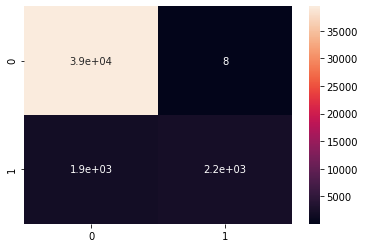

In [108]:
cm = metrics.confusion_matrix(Y_test, y_pred4)
sns.heatmap(cm, annot=True)

from sklearn.model_selection import GridSearchCV
params = {'n_estimators':[1,5,10,100,1000], 'criterion' : ['gini', 'entropy']}

grid = GridSearchCV(rfc, params, n_jobs = -1, verbose = 2)
grid.fit(X_ros, y_ros)

grid.best_params_

## OverSampling RandomOverSampler

In [109]:
from imblearn.over_sampling import RandomOverSampler

ros = RandomOverSampler()
X_ros, y_ros = ros.fit_sample(X_train, Y_train)

print(X_ros.shape[0] - X_train.shape[0], 'new random picked points')

y_ros['class'].value_counts()

82535 new random picked points


1    92023
0    92023
Name: class, dtype: int64

In [110]:
rfc2 = RandomForestClassifier(n_estimators = 1000)
rfc2.fit(X_ros,y_ros)

C:\Users\tashi\anaconda3\lib\site-packages\ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


RandomForestClassifier(n_estimators=1000)

In [111]:
y_pred5 = rfc2.predict(X_test)
dfpred5 = pd.DataFrame({'pred':y_pred5,'actual':Y_test['class'].values})
FN5 = dfpred5.pred[(dfpred5.actual == 1) & (dfpred5.pred == 0)].count()
TP5 = dfpred5.actual[(dfpred5.actual == 1) & (dfpred5.pred == 1)].count()
FP5 = dfpred5.actual[(dfpred5.actual == 0) & (dfpred5.pred == 1)].count()
TN5 = dfpred5.actual[(dfpred5.actual == 0) & (dfpred5.pred == 0)].count()

In [112]:
Accuracy = (TP5+TN5)/(TP5+TN5+FP5+FN5)*100
Recall = TP5/(TP5+FN5)*100
Precision = TP5/(TP5 + FP5)*100
print("Le taux d'Accuracy du modèle est de {}% (le pourcentage de nos predictions qui se sont avéré correctes)".format(round(Accuracy,2)))
print("Le taux de Recall du modèle est de {}% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)".format(round(Recall,2)))
print("Le taux de Precision du modèle est de {}% (le pourcentage de prediction 1 qui sont correctes)".format(round(Precision,2)))

Le taux d'Accuracy du modèle est de 95.47% (le pourcentage de nos predictions qui se sont avéré correctes)
Le taux de Recall du modèle est de 53.42% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)
Le taux de Precision du modèle est de 96.53% (le pourcentage de prediction 1 qui sont correctes)


## OverSampling SMOTE

In [113]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(sampling_strategy='minority', random_state = 42)
X_sm, Y_sm = smote.fit_sample(X_train, Y_train)

In [114]:
rfc3 = RandomForestClassifier(n_estimators = 1000)
rfc3.fit(X_sm,Y_sm)

C:\Users\tashi\anaconda3\lib\site-packages\ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


RandomForestClassifier(n_estimators=1000)

In [115]:
y_pred6 = rfc2.predict(X_test)
dfpred6 = pd.DataFrame({'pred':y_pred6,'actual':Y_test['class'].values})
FN6 = dfpred6.pred[(dfpred6.actual == 1) & (dfpred6.pred == 0)].count()
TP6 = dfpred6.actual[(dfpred6.actual == 1) & (dfpred6.pred == 1)].count()
FP6 = dfpred6.actual[(dfpred6.actual == 0) & (dfpred6.pred == 1)].count()
TN6 = dfpred6.actual[(dfpred6.actual == 0) & (dfpred6.pred == 0)].count()

In [116]:
Accuracy = (TP6+TN6)/(TP6+TN6+FP6+FN6)*100
Recall = TP6/(TP6+FN6)*100
Precision = TP6/(TP6 + FP6)*100
print("Le taux d'Accuracy du modèle est de {}% (le pourcentage de nos predictions qui se sont avéré correctes)".format(round(Accuracy,2)))
print("Le taux de Recall du modèle est de {}% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)".format(round(Recall,2)))
print("Le taux de Precision du modèle est de {}% (le pourcentage de prediction 1 qui sont correctes)".format(round(Precision,2)))

Le taux d'Accuracy du modèle est de 95.47% (le pourcentage de nos predictions qui se sont avéré correctes)
Le taux de Recall du modèle est de 53.42% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)
Le taux de Precision du modèle est de 96.53% (le pourcentage de prediction 1 qui sont correctes)


## XGBOOST

In [117]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [118]:
from xgboost import XGBClassifier
regressor_xgb = XGBClassifier()
regressor_xgb.fit(X_ros, y_ros)
regressor_xgb.score(X_test, Y_test)

C:\Users\tashi\anaconda3\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


0.9443295177676643

In [119]:
params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }
best = GridSearchCV(XGBClassifier(), params)
best.fit(X_ros, y_ros)

NameError: name 'GridSearchCV' is not defined

In [120]:
y_pred7 = regressor_xgb.predict(X_test)
dfpred7 = pd.DataFrame({'pred':y_pred7,'actual':Y_test['class'].values})
FN7 = dfpred7.pred[(dfpred7.actual == 1) & (dfpred7.pred == 0)].count()
TP7 = dfpred7.actual[(dfpred7.actual == 1) & (dfpred7.pred == 1)].count()
FP7 = dfpred7.actual[(dfpred7.actual == 0) & (dfpred7.pred == 1)].count()
TN7 = dfpred7.actual[(dfpred7.actual == 0) & (dfpred7.pred == 0)].count()

In [121]:
Accuracy = (TP7+TN7)/(TP7+TN7+FP7+FN7)*100
Recall = TP7/(TP7+FN7)*100
Precision = TP7/(TP7 + FP7)*100
print("Le taux d'Accuracy du modèle est de {}% (le pourcentage de nos predictions qui se sont avéré correctes)".format(round(Accuracy,2)))
print("Le taux de Recall du modèle est de {}% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)".format(round(Recall,2)))
print("Le taux de Precision du modèle est de {}% (le pourcentage de prediction 1 qui sont correctes)".format(round(Precision,2)))

Le taux d'Accuracy du modèle est de 94.43% (le pourcentage de nos predictions qui se sont avéré correctes)
Le taux de Recall du modèle est de 54.03% (le pourcentage de réelles valeurs 1 que nous avons pu prédire)
Le taux de Precision du modèle est de 79.89% (le pourcentage de prediction 1 qui sont correctes)


In [122]:
lis = list(X.columns)

In [123]:
lis.append('Actual')
lis.append('Pred')

In [148]:
new = pd.concat([pd.DataFrame(X_test),pd.DataFrame(y_pred7),Y_test['class'].reset_index()], axis = 1, ignore_index = True).drop(columns  = [46])
new.columns = lis

In [172]:
newf = new[(new.Actual == 1) & (new.Pred ==0)]